# Hannah Zhao - Final Presentation
## sox10

In [2]:
# Standard library imports
import os
import re
import random
import shutil
from datetime import datetime
from collections import OrderedDict

# Data handling and visualization libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# PyTorch and TorchVision libraries for deep learning
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, random_split
import torchvision
import torchvision.models as models
from torchvision import transforms, datasets
from PIL import Image

# Scikit-Learn for evaluation metrics and data splitting|
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report

# Imbalanced-learn for oversampling to address class imbalance
from imblearn.over_sampling import RandomOverSampler

from torchvision import transforms
from torchvision.transforms import functional as F
from PIL import Image
from PIL import Image
from PIL import UnidentifiedImageError
from tqdm import tqdm

import os, re, random
from collections import defaultdict, Counter
from sklearn.model_selection import train_test_split

In [3]:
# Define local file paths

# Define your Desktop folder based on your OS; this uses the user's home directory.
desktop = os.path.join(os.path.expanduser("~"), "Desktop")

# Path to the filtered patches folder on your Desktop
filtered_patches_dir = os.path.join(desktop, "uni", "STAT 390", "Hannah Zhao", "CMIL_SP2025_Patches_Apr27_Filtered60px")

# Path to the CSV file inside Desktop/uni/STAT 390/Hannah Zhao
csv_file_path = os.path.join(desktop, "uni", "STAT 390", "Hannah Zhao", "case_grade_match.csv")

# Directory to store model checkpoints
checkpoint_dir = os.path.join(desktop, "uni", "STAT 390", "Hannah Zhao", "Checkpoints")
os.makedirs(checkpoint_dir, exist_ok=True)  # Create the directory if it doesn't exist

# load labels 
labels = pd.read_csv(csv_file_path)

In [4]:
import random
from collections import defaultdict

def balance_by_patch_count(patch_dict, label_map):
    # Group slices by class
    class_to_slices = defaultdict(list)
    for slice_key, paths in patch_dict.items():
        if slice_key in label_map:
            label = label_map[slice_key]
            class_to_slices[label].append((slice_key, paths))

    # Count total patches per class
    patch_counts = {label: sum(len(paths) for _, paths in slices)
                    for label, slices in class_to_slices.items()}
    print("🧮 Patch counts before balancing:", patch_counts)

    # Determine the minimum patch count to balance
    min_count = min(patch_counts.values())

    balanced_dict = {}
    for label, slices in class_to_slices.items():
        all_slice_entries = slices.copy()
        random.shuffle(all_slice_entries)

        selected_slices = []
        accumulated_patches = 0

        for slice_key, paths in all_slice_entries:
            if accumulated_patches + len(paths) <= min_count:
                selected_slices.append((slice_key, paths))
                accumulated_patches += len(paths)
            else:
                # Optionally truncate the last slice to exactly match min_count
                needed = min_count - accumulated_patches
                if needed > 0:
                    truncated_paths = random.sample(paths, needed)
                    selected_slices.append((slice_key, truncated_paths))
                    accumulated_patches += needed
                break

        for slice_key, paths in selected_slices:
            balanced_dict[slice_key] = paths

        print(f"✔️ Used {len(selected_slices)} slices for class {label}, total patches: {accumulated_patches}")

    return balanced_dict

In [5]:
# === Slice-Level Grouping ===
def group_patches_by_slice(root_dir):
    case_slices = defaultdict(list)
    for root, _, files in os.walk(root_dir):
        for filename in files:
            if filename.endswith(".png"):
                match = re.match(r"case_(\d+)_([a-z]+_\d+)_", filename)
                if match:
                    case_id = int(match.group(1))
                    slice_id = match.group(2)
                    key = (case_id, slice_id)
                    case_slices[key].append(os.path.join(root, filename))
    return case_slices

# === Load Patches by Slice ===
patches = group_patches_by_slice(filtered_patches_dir)

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

#adding data augmentation like random crop, flips, rotation

# Training transform (augmented)
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(224),
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

# === Build Label Map by Slice ===
slice_to_class = {}
valid_classes = [1.0, 3.0, 4.0]
for (case_id, slice_id), paths in patches.items():
    raw_label = labels.loc[labels['Case'] == case_id, 'Class']
    if not raw_label.empty and raw_label.item() in valid_classes:
        label = 0 if raw_label.item() == 1.0 else 1
        slice_to_class[(case_id, slice_id)] = label

# === Stratified Split by Slice ===
slices_by_class = defaultdict(list)
for key, label in slice_to_class.items():
    slices_by_class[label].append(key)

train_slices, val_slices, test_slices = [], [], []
for label, slice_keys in slices_by_class.items():
    train, temp = train_test_split(slice_keys, test_size=0.4, random_state=42)
    val, test = train_test_split(temp, test_size=0.5, random_state=42)
    train_slices += train
    val_slices += val
    test_slices += test

train_patches = {k: patches[k] for k in train_slices}
val_patches   = {k: patches[k] for k in val_slices}
test_patches  = {k: patches[k] for k in test_slices}

# === Filter to H&E Only ===

def filter_by_stain(d, keyword):
    out, dropped = {}, []
    for k, paths in d.items():
        filtered = [p for p in paths if keyword.lower() in os.path.basename(p).lower()]
        if filtered:
            out[k] = filtered
        else:
            dropped.append(k)
    if dropped:
        print(f"⚠️ Dropped slices with no '{keyword}' patches: {dropped}")
    return out


train_patches = filter_by_stain(train_patches, "sox10")
val_patches   = filter_by_stain(val_patches, "sox10")
test_patches  = filter_by_stain(test_patches, "sox10")
train_patches = balance_by_patch_count(train_patches, slice_to_class)

⚠️ Dropped slices with no 'sox10' patches: [(3, 'unmatched_3'), (50, 'match_4'), (11, 'unmatched_2'), (32, 'unmatched_3'), (1, 'unmatched_1'), (12, 'unmatched_2'), (32, 'unmatched_1'), (19, 'match_2'), (59, 'match_1'), (64, 'match_3'), (7, 'unmatched_2'), (64, 'match_2'), (9, 'unmatched_2'), (1, 'unmatched_2'), (12, 'unmatched_1'), (36, 'unmatched_2'), (4, 'unmatched_1'), (28, 'unmatched_4'), (36, 'unmatched_3'), (2, 'unmatched_2'), (2, 'unmatched_1'), (30, 'unmatched_2'), (34, 'unmatched_3'), (30, 'unmatched_1'), (2, 'unmatched_3'), (36, 'unmatched_1')]
⚠️ Dropped slices with no 'sox10' patches: [(3, 'unmatched_1'), (5, 'unmatched_1'), (32, 'unmatched_2'), (7, 'unmatched_1'), (11, 'unmatched_3'), (28, 'unmatched_3'), (4, 'unmatched_2'), (28, 'unmatched_1'), (56, 'match_1')]
⚠️ Dropped slices with no 'sox10' patches: [(3, 'unmatched_2'), (9, 'unmatched_1'), (1, 'unmatched_3'), (19, 'match_4'), (28, 'unmatched_2'), (34, 'unmatched_1'), (34, 'unmatched_2')]
🧮 Patch counts before balancin

In [7]:
# just a way of grouping all the patches into a case data point, so to output each sample as a 4d tensor shape containing
# the number of patches, number of channels, and size, and also the case label

# Randomly crops a rectangular portion of the input image, and

# Resizes that cropped region to a fixed size (like 224×224).






# brainstorm other things we could try
# discuss how MIL works on Wednesday 

# slice level instead of case level? 
# consider classification at slice level ---- can tell with the name of the file, unmatched_1 or match_2, match_3, etc -- need to take the text after second underscore

# === MILDataset with slice-level keys ===
class SliceMILDataset(Dataset):
    def __init__(self, patch_dict, label_map, transform=None, emergency_cap=800):
        self.transform = transform
        self.emergency_cap = emergency_cap
        self.bags, self.labels = [], []
        for slice_key, paths in patch_dict.items():
            if slice_key in label_map:
                self.bags.append(paths)
                self.labels.append(label_map[slice_key])

    def __len__(self): return len(self.bags)

    def __getitem__(self, idx):
        paths = self.bags[idx]
        imgs = []
        for p in paths:
            try:
                img = Image.open(p).convert('RGB')
                if self.transform:
                    img = self.transform(img)
                imgs.append(img)
            except:
                continue
        if len(imgs) == 0:
            raise ValueError(f"No usable patches in slice {paths}")
        if self.emergency_cap and len(imgs) > self.emergency_cap:
            imgs = random.sample(imgs, self.emergency_cap)
        return torch.stack(imgs), torch.tensor(self.labels[idx], dtype=torch.long)


# this pools the patch level features into single bag level representation for MIL
class AttentionPool(nn.Module):
    def __init__(self, input_dim, hidden_dim=128):
        super().__init__()
        # creates small neural network to compute attention scores for each patch 
        # each patch embedding is passed through a linear layer, tanh for nonlinearity, and another linear layer to get a scalar score
        self.attention = nn.Sequential(
            nn.Linear(input_dim, hidden_dim),
            nn.Tanh(),
            nn.Linear(hidden_dim, 1)
        )

    def forward(self, x, return_weights=False):
        # x is of shape (B, M, D) where B is batch size or number of cases, 
        # M is number of patches per bag, and D is the embedding dimensions for each patch
        weights = self.attention(x)     # (B, M, 1)
        weights = torch.softmax(weights, dim=1)
        # outputs attention scores for each patch and normalized with softmax
        # D is the embedding dimension which is size of feature vector for each patch after going through the patch classifier 
        weighted_x = (weights * x).sum(dim=1)  # (B, D)
        # returning the raw attention weights per patch just to help with visualization of the weights for each patch
        if return_weights:
            return weighted_x, weights.squeeze(-1)  # (B, D), (B, M)
        return weighted_x
    

# using Densenet to extract features at the patch-level, and adaptaive pooling for patch-level feature pooling
# the patch features are passed into Attentionpool which learns the weights across patches and combines them into a single bag label


class AttnMIL(nn.Module):
    def __init__(self, base_model, num_classes=2, embed_dim=512):
        super().__init__()
        # grabbing the convolutional feature extractor from the pretrained model 
        self.features = base_model.features
        # applying adaptive average pooling to compress to feature map of 2x2 grid
        # you get 4 spatial vectors per patch
        self.pool = nn.AdaptiveAvgPool2d((2,2))  # richer than (1,1)
        # meaning that you'll get 4 vectors per patch which will then be flattened
        self.patch_projector = nn.Linear(base_model.classifier.in_features * 4, embed_dim)
        self.attention_pool = AttentionPool(embed_dim)
        self.classifier = nn.Linear(embed_dim, num_classes)
    

    def forward(self, x, return_patch_logits=False, return_attn_weights=False):
        if x.dim() == 4:
            x = x.unsqueeze(0)
        # typically after CNN you get 3D tensor with num channels, height and width of image
        # but we packed the patches into a bag by case (the tensor), so B is batch size, M is number of patches per bag
        B, M, C, H, W = x.shape
        x = x.view(B*M, C, H, W)

        features = self.features(x) # exxtracting cnn features for each patch
        pooled = self.pool(features).view(B*M, -1) # pool each feature map to a 2x2 grid and flatten
        embedded = self.patch_projector(pooled).view(B, M, -1) # project each patch into shared embedding space -- 
        # just ensuring all the patches are transformed into vectors of the same length for attention

        # in order to get patch level predictions 
        if return_patch_logits:
            logits = self.classifier(embedded)  # (B, M, 2)
            return logits
        # returning attention weights for visualization
        if return_attn_weights:
            bag_emb, attn_weights = self.attention_pool(embedded, return_weights=True)
            logits = self.classifier(bag_emb)
            return logits, attn_weights  # bag prediction + per-patch attention scores
        
        # applying attention 
        #computing a weighted average of patch embeddings using attention, and then is passed through the classifier to get bag level prediction
        bag_emb = self.attention_pool(embedded)
        logits = self.classifier(bag_emb)
        return logits


In [6]:
from collections import defaultdict

def count_patches_by_class(patch_dict, case_to_class, split_name):
    class_patch_counts = defaultdict(int)

    for case, patches in patch_dict.items():
        label = case_to_class[case]
        class_patch_counts[label] += len(patches)

    print(f"\n🧬 Patch count by class for {split_name}:")
    print(f"  Benign (0):     {class_patch_counts[0]} patches")
    print(f"  High-grade (1): {class_patch_counts[1]} patches")

    return class_patch_counts

# Count patches per class for each split
train_counts = count_patches_by_class(train_patches, slice_to_class, "Train")
val_counts   = count_patches_by_class(val_patches, slice_to_class, "Validation")
test_counts  = count_patches_by_class(test_patches, slice_to_class, "Test")


🧬 Patch count by class for Train:
  Benign (0):     1658 patches
  High-grade (1): 1658 patches

🧬 Patch count by class for Validation:
  Benign (0):     894 patches
  High-grade (1): 1320 patches

🧬 Patch count by class for Test:
  Benign (0):     760 patches
  High-grade (1): 1134 patches


In [8]:
# Set up datasets
# Set up slice-based MIL datasets
train_ds = SliceMILDataset(train_patches, slice_to_class, transform=train_transform)
val_ds   = SliceMILDataset(val_patches, slice_to_class, transform=transform)
test_ds  = SliceMILDataset(test_patches, slice_to_class, transform=transform, emergency_cap=None)

# help generalize better and reduce overfitting
train_loader = DataLoader(train_ds, batch_size=1, shuffle=True)
# don't want to shuffle so taht you get consistent, repeatable evaluation
val_loader   = DataLoader(val_ds, batch_size=1, shuffle=False)
test_loader  = DataLoader(test_ds, batch_size=1, shuffle=False)

In [9]:
def save_checkpoint(model, arch, checkpoint_dir, optimizer, epoch):
    os.makedirs(checkpoint_dir, exist_ok=True)
    timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
    filename = f"{checkpoint_dir}/{timestamp}_{arch}_epoch{epoch}.pth"
    checkpoint = {
        "arch": arch,
        "model_state_dict": model.state_dict(),
        "epoch": epoch,
        "optimizer_state_dict": optimizer.state_dict(),
    }
    torch.save(checkpoint, filename)
    print(f"✅ Checkpoint saved: {filename}")

def validation(model, criterion, val_loader):
    val_loss = 0
    correct_total = 0
    sample_total = 0
    model.eval()
    with torch.no_grad():
        for bags, labels in val_loader:
            bags = bags.to(device)
            labels = labels.to(device)
            outputs = model(bags)
            loss = criterion(outputs, labels)
            val_loss += loss.item() * labels.size(0)
            preds = torch.argmax(outputs, dim=1)
            correct_total += (preds == labels).sum().item()
            sample_total += labels.size(0)
    return val_loss / sample_total, correct_total / sample_total

def train_model(model, optimizer, criterion, train_loader, val_loader, arch, checkpoint_dir, epochs=5):
    for epoch in range(epochs):
        model.train()
        running_loss = 0
        for bags, labels in tqdm(train_loader, desc=f"Epoch {epoch+1}/{epochs}"):
            bags = bags.to(device)
            labels = labels.to(device)
            optimizer.zero_grad()
            outputs = model(bags)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
            running_loss += loss.item()
        val_loss, val_acc = validation(model, criterion, val_loader)
        print(f"Epoch {epoch+1}/{epochs}, Train Loss: {running_loss/len(train_loader):.3f}, Val Loss: {val_loss:.3f}, Val Acc: {val_acc:.3f}")
        save_checkpoint(model, arch, checkpoint_dir, optimizer, epoch+1)
    return model

In [10]:
# ------------------- Load pretrained patch model -------------------
# used for classifiing individual image patches, its convolutional layers are used as frozen feature extractor in MIL
class PatchClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        base = models.densenet121(weights=models.DenseNet121_Weights.DEFAULT)
        # loading the pre trained densenet model
        self.features = base.features
        # compress final convolutional output of each image to 2x2 feature map
        self.pool = nn.AdaptiveAvgPool2d((2,2))
        self.classifier = nn.Linear(base.classifier.in_features * 4, 2)
    
    def forward(self, x):
        # first passes input images through Densenet convolutional layers to get feature maps
        x = self.features(x)
        # applies pooling
        x = self.pool(x).view(x.size(0), -1)
        # passes to final classifier layer to get the logits
        return self.classifier(x)

patch_model = PatchClassifier()
patch_model.load_state_dict(torch.load(os.path.join(checkpoint_dir, "patch_classifier.pth")))
patch_model.eval()

PatchClassifier(
  (features): Sequential(
    (conv0): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (norm0): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (relu0): ReLU(inplace=True)
    (pool0): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
    (denseblock1): _DenseBlock(
      (denselayer1): _DenseLayer(
        (norm1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu1): ReLU(inplace=True)
        (conv1): Conv2d(64, 128, kernel_size=(1, 1), stride=(1, 1), bias=False)
        (norm2): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (relu2): ReLU(inplace=True)
        (conv2): Conv2d(128, 32, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      )
      (denselayer2): _DenseLayer(
        (norm1): BatchNorm2d(96, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      

In [11]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
# ------------------- Inject backbone into MIL -------------------
# creating new densenet model with no pretrained weights
base_model = models.densenet121(weights=None)
# replacing its features or convolutional layers with the pretrained ones from the patch classifier that we loaded
base_model.features = patch_model.features

# creating the Attention MIL model using the pretrained feature extractor
model = AttnMIL(base_model=base_model).to(device)
# freezing the feature extractor
for param in model.features.parameters():
    param.requires_grad = False

optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
criterion = nn.CrossEntropyLoss()
arch = "densenet121_simplemil"


train_loader = DataLoader(train_ds, batch_size=1, shuffle=True)
val_loader = DataLoader(val_ds, batch_size=1, shuffle=False)
test_loader = DataLoader(test_ds, batch_size=1, shuffle=False)

In [12]:
# Train model
trained_model = train_model(
    model=model,
    optimizer=optimizer,
    criterion=criterion,
    train_loader=train_loader,
    val_loader=val_loader,
    arch=arch,
    checkpoint_dir=checkpoint_dir,
    epochs=5,
)

Epoch 1/5: 100%|██████████| 30/30 [33:19<00:00, 66.66s/it]


Epoch 1/5, Train Loss: 3.713, Val Loss: 1.811, Val Acc: 0.647
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250610_010158_densenet121_simplemil_epoch1.pth


Epoch 2/5: 100%|██████████| 30/30 [29:41<00:00, 59.39s/it]  


Epoch 2/5, Train Loss: 1.159, Val Loss: 0.533, Val Acc: 0.765
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250610_015114_densenet121_simplemil_epoch2.pth


Epoch 3/5: 100%|██████████| 30/30 [29:06<00:00, 58.23s/it]


Epoch 3/5, Train Loss: 0.798, Val Loss: 1.373, Val Acc: 0.353
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250610_024044_densenet121_simplemil_epoch3.pth


Epoch 4/5: 100%|██████████| 30/30 [29:46<00:00, 59.55s/it]


Epoch 4/5, Train Loss: 0.661, Val Loss: 1.073, Val Acc: 0.529
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250610_033212_densenet121_simplemil_epoch4.pth


Epoch 5/5: 100%|██████████| 30/30 [31:29<00:00, 62.97s/it]


Epoch 5/5, Train Loss: 0.626, Val Loss: 0.849, Val Acc: 0.647
✅ Checkpoint saved: /Users/hannahzhao/Desktop/uni/STAT 390/Hannah Zhao/Checkpoints/20250610_042427_densenet121_simplemil_epoch5.pth


=== Slice-Level Classification Report ===
                 precision    recall  f1-score   support

         Benign       0.33      0.20      0.25         5
High-grade CMIL       0.76      0.87      0.81        15

       accuracy                           0.70        20
      macro avg       0.55      0.53      0.53        20
   weighted avg       0.66      0.70      0.67        20


=== Patch-Level Classification Report (weak labels) ===
                 precision    recall  f1-score   support

         Benign       0.38      0.04      0.06       760
High-grade CMIL       0.60      0.96      0.74      1134

       accuracy                           0.59      1894
      macro avg       0.49      0.50      0.40      1894
   weighted avg       0.51      0.59      0.47      1894



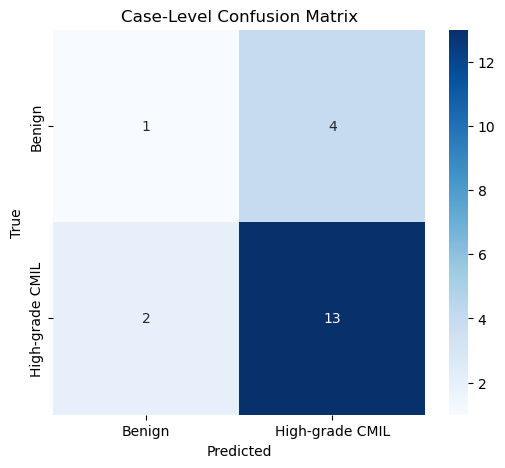

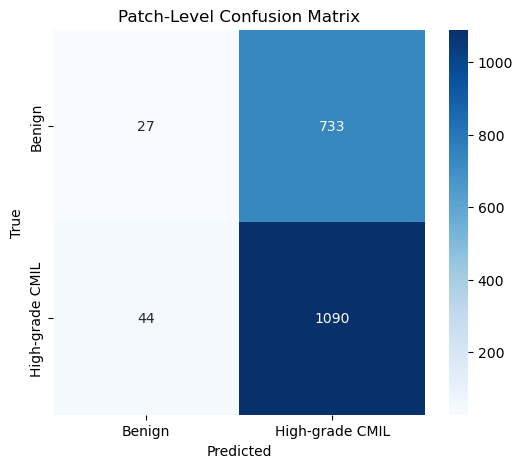

In [13]:
# ------------------- Evaluation -------------------
model.eval()
all_preds, all_trues = [], []
all_patch_preds, all_patch_trues = [], []

with torch.no_grad():
    for X_bag, y in test_loader:
        X_bag, y = X_bag.to(device), y.to(device)

        # Case-level prediction
        bag_logits = model(X_bag)
        bag_pred = bag_logits.argmax(dim=1)
        all_preds.extend(bag_pred.cpu().numpy())
        all_trues.extend(y.cpu().numpy())

        # Patch-level prediction (weak supervision)
        patch_logits = model(X_bag, return_patch_logits=True)
        patch_pred = patch_logits.argmax(dim=2).squeeze(0).cpu().numpy()
        patch_labels = y.cpu().item() * np.ones_like(patch_pred)

        all_patch_preds.extend(patch_pred)
        all_patch_trues.extend(patch_labels)

# Reports
print("=== Slice-Level Classification Report ===")
print(classification_report(all_trues, all_preds, target_names=['Benign', 'High-grade CMIL'], labels=[0,1]))

print("\n=== Patch-Level Classification Report (weak labels) ===")
print(classification_report(all_patch_trues, all_patch_preds, target_names=['Benign', 'High-grade CMIL'], labels=[0,1]))

# Confusion matrices
for name, preds, trues in [
    ("Case-Level", all_preds, all_trues),
    ("Patch-Level", all_patch_preds, all_patch_trues)
]:
    cm = confusion_matrix(trues, preds)
    plt.figure(figsize=(6,5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
                xticklabels=['Benign','High-grade CMIL'],
                yticklabels=['Benign','High-grade CMIL'])
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.title(f"{name} Confusion Matrix")
    plt.show()

=== Aggregated Case-Level Classification Report ===
                 precision    recall  f1-score   support

         Benign       0.50      0.25      0.33         4
High-grade CMIL       0.77      0.91      0.83        11

       accuracy                           0.73        15
      macro avg       0.63      0.58      0.58        15
   weighted avg       0.70      0.73      0.70        15



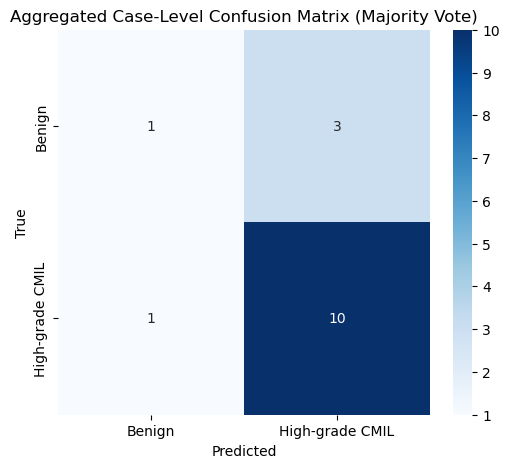

In [14]:
from collections import defaultdict

# Rebuild mapping from test set index to case_id
slice_keys = list(test_patches.keys())  # keys like (case_id, slice_id)

# Store per-slice predictions and truths
case_preds = defaultdict(list)
case_trues = {}

with torch.no_grad():
    for i, (X_bag, y) in enumerate(test_loader):
        X_bag, y = X_bag.to(device), y.to(device)
        logits = model(X_bag)
        pred = logits.argmax(dim=1).item()

        case_id = slice_keys[i][0]  # extract case_id from (case_id, slice_id)
        case_preds[case_id].append(pred)
        case_trues[case_id] = y.item()  # same for all slices of this case

# Majority vote per case
final_preds = []
final_trues = []
for case_id in sorted(case_preds.keys()):
    votes = case_preds[case_id]
    maj_pred = max(set(votes), key=votes.count)
    final_preds.append(maj_pred)
    final_trues.append(case_trues[case_id])

# Report
print("=== Aggregated Case-Level Classification Report ===")
print(classification_report(final_trues, final_preds, target_names=['Benign', 'High-grade CMIL']))

cm = confusion_matrix(final_trues, final_preds)
plt.figure(figsize=(6,5))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues',
            xticklabels=['Benign','High-grade CMIL'],
            yticklabels=['Benign','High-grade CMIL'])
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Aggregated Case-Level Confusion Matrix (Majority Vote)")
plt.show()


In [15]:
import random
import matplotlib.pyplot as plt
from PIL import Image

def visualize_top_attended_patches(model, test_ds, num_cases=3, top_k=5):
    model.eval()
    selected_indices = random.sample(range(len(test_ds)), num_cases)
    
    for idx in selected_indices:
        bag, label = test_ds[idx]
        bag = bag.unsqueeze(0).to(device)
        label = label.item()

        with torch.no_grad():
            logits, attn_weights = model(bag, return_attn_weights=True)
            pred = logits.argmax(dim=1).item()
            correct = (pred == label)
            attn_weights = attn_weights.squeeze(0).cpu().numpy()

        patch_paths = test_ds.bags[idx]
        top_indices = attn_weights.argsort()[-top_k:][::-1]

        print(f"\n🧪 Case #{idx}: True label = {label}, Predicted = {pred}, Correct = {correct}")
        print("Top patches with highest attention:")

        plt.figure(figsize=(15, 3))
        for i, patch_idx in enumerate(top_indices):
            patch_path = patch_paths[patch_idx]
            img = Image.open(patch_path)
            weight = attn_weights[patch_idx]
            
            print(f"  - {os.path.basename(patch_path)}: attention = {weight:.4f}")

            plt.subplot(1, top_k, i + 1)
            plt.imshow(img)
            plt.axis('off')
            plt.title(f"attn={weight:.3f}")
        plt.suptitle(f"Case {idx} | True: {label} | Pred: {pred} | Correct: {correct}")
        plt.tight_layout()
        plt.show()



🧪 Case #18: True label = 0, Predicted = 1, Correct = False
Top patches with highest attention:
  - case_79_match_2_sox10_patch1.png: attention = 0.2498
  - case_79_match_2_sox10_patch3.png: attention = 0.2498
  - case_79_match_2_sox10_patch2.png: attention = 0.2498
  - case_79_match_2_sox10_patch0.png: attention = 0.0976
  - case_79_match_2_sox10_patch31.png: attention = 0.0118
  - case_79_match_2_sox10_patch17.png: attention = 0.0073


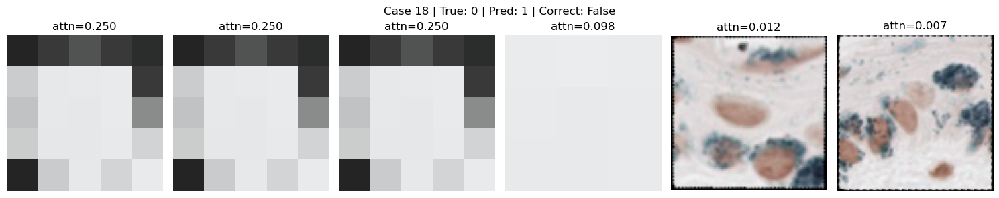


🧪 Case #0: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_91_match_2_sox10_patch1.png: attention = 0.1699
  - case_91_match_2_sox10_patch23.png: attention = 0.0642
  - case_91_match_2_sox10_patch2.png: attention = 0.0547
  - case_91_match_2_sox10_patch20.png: attention = 0.0506
  - case_91_match_2_sox10_patch24.png: attention = 0.0470
  - case_91_match_2_sox10_patch25.png: attention = 0.0410


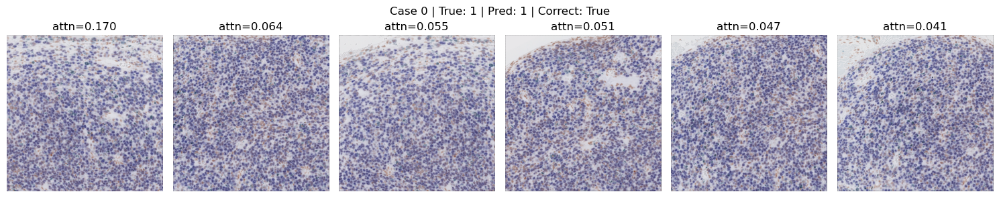


🧪 Case #2: True label = 1, Predicted = 0, Correct = False
Top patches with highest attention:
  - case_97_match_3_sox10_patch34.png: attention = 0.3061
  - case_97_match_3_sox10_patch89.png: attention = 0.3014
  - case_97_match_3_sox10_patch79.png: attention = 0.1330
  - case_97_match_3_sox10_patch62.png: attention = 0.1176
  - case_97_match_3_sox10_patch76.png: attention = 0.0529
  - case_97_match_3_sox10_patch90.png: attention = 0.0488


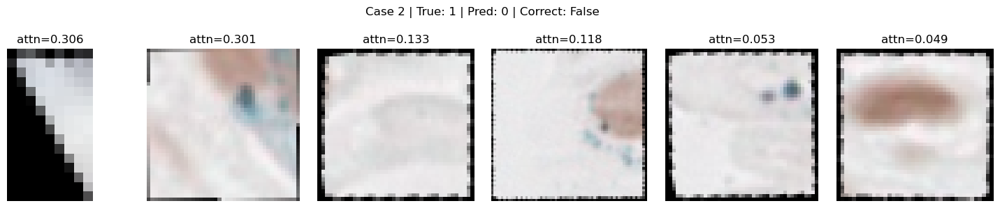


🧪 Case #9: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_057_match_1_sox10_patch40.png: attention = 0.1569
  - case_057_match_1_sox10_patch42.png: attention = 0.1564
  - case_057_match_1_sox10_patch27.png: attention = 0.1392
  - case_057_match_1_sox10_patch45.png: attention = 0.1343
  - case_057_match_1_sox10_patch41.png: attention = 0.1289
  - case_057_match_1_sox10_patch29.png: attention = 0.1059


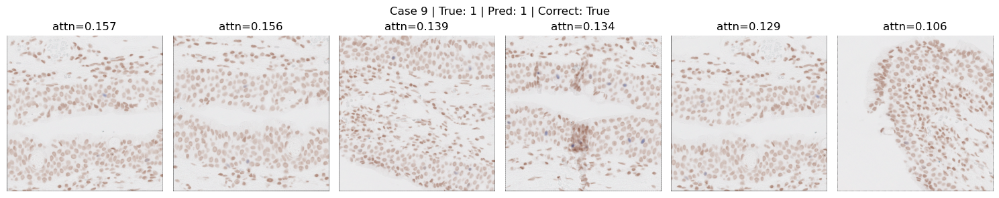


🧪 Case #15: True label = 0, Predicted = 1, Correct = False
Top patches with highest attention:
  - case_43_match_1_sox10_patch8.png: attention = 0.0218
  - case_43_match_1_sox10_patch5.png: attention = 0.0205
  - case_43_match_1_sox10_patch109.png: attention = 0.0198
  - case_43_match_1_sox10_patch109(1).png: attention = 0.0198
  - case_43_match_1_sox10_patch19.png: attention = 0.0155
  - case_43_match_1_sox10_patch22.png: attention = 0.0144


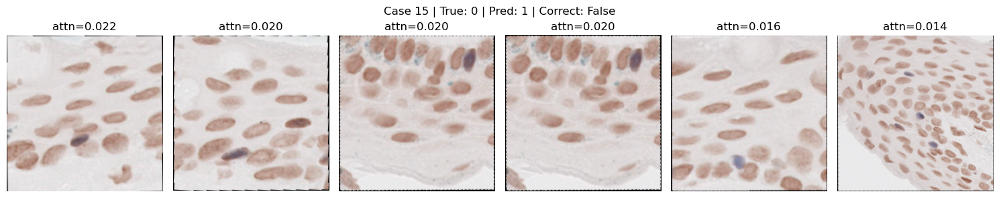


🧪 Case #11: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_44_match_2_sox10_patch80.png: attention = 0.0122
  - case_44_match_2_sox10_patch21.png: attention = 0.0120
  - case_44_match_2_sox10_patch121.png: attention = 0.0119
  - case_44_match_2_sox10_patch47.png: attention = 0.0118
  - case_44_match_2_sox10_patch53.png: attention = 0.0117
  - case_44_match_2_sox10_patch49.png: attention = 0.0117


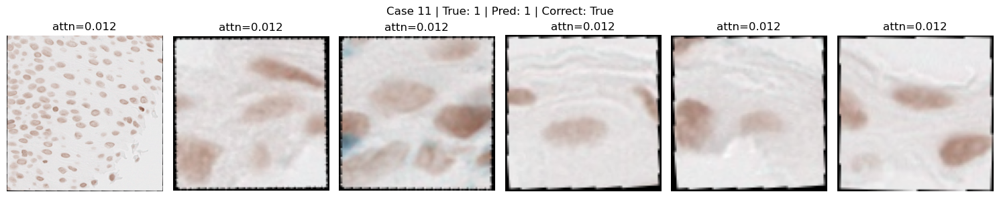


🧪 Case #8: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_99_match_1_sox10_patch34.png: attention = 0.1102
  - case_99_match_1_sox10_patch35.png: attention = 0.1024
  - case_99_match_1_sox10_patch20.png: attention = 0.0903
  - case_99_match_1_sox10_patch30.png: attention = 0.0749
  - case_99_match_1_sox10_patch1.png: attention = 0.0626
  - case_99_match_1_sox10_patch16.png: attention = 0.0547


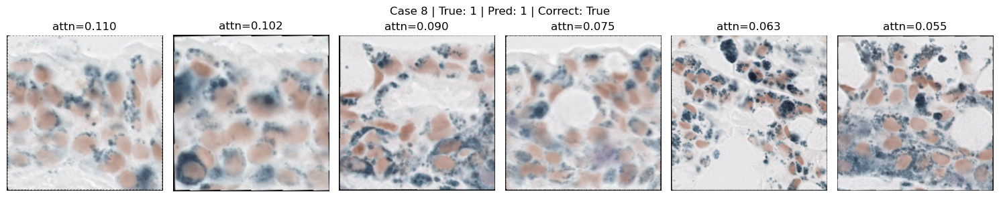


🧪 Case #7: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_42_match_1_sox10_patch31.png: attention = 0.0418
  - case_42_match_1_sox10_patch51.png: attention = 0.0395
  - case_42_match_1_sox10_patch32.png: attention = 0.0362
  - case_42_match_1_sox10_patch1.png: attention = 0.0280
  - case_42_match_1_sox10_patch58.png: attention = 0.0261
  - case_42_match_1_sox10_patch70.png: attention = 0.0261


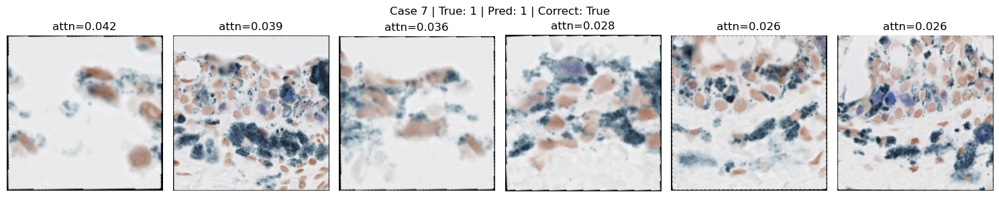


🧪 Case #19: True label = 0, Predicted = 1, Correct = False
Top patches with highest attention:
  - case_93_match_1_sox10_patch59.png: attention = 0.4676
  - case_93_match_1_sox10_patch60.png: attention = 0.0922
  - case_93_match_1_sox10_patch28.png: attention = 0.0843
  - case_93_match_1_sox10_patch56.png: attention = 0.0211
  - case_93_match_1_sox10_patch137.png: attention = 0.0178
  - case_93_match_1_sox10_patch41.png: attention = 0.0160


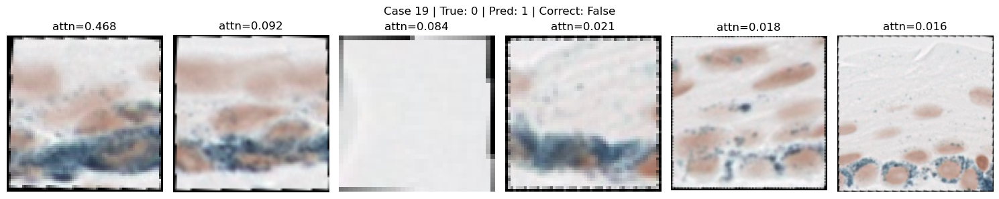


🧪 Case #6: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_057_match_3_sox10_patch105.png: attention = 0.0201
  - case_057_match_3_sox10_patch75.png: attention = 0.0165
  - case_057_match_3_sox10_patch111.png: attention = 0.0155
  - case_057_match_3_sox10_patch108.png: attention = 0.0152
  - case_057_match_3_sox10_patch81.png: attention = 0.0151
  - case_057_match_3_sox10_patch109.png: attention = 0.0140


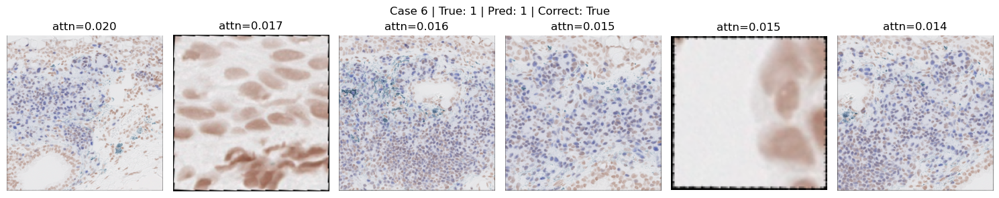


🧪 Case #5: True label = 1, Predicted = 1, Correct = True
Top patches with highest attention:
  - case_9_match_1_sox10_patch11.png: attention = 0.0922
  - case_9_match_1_sox10_patch9.png: attention = 0.0903
  - case_9_match_1_sox10_patch0.png: attention = 0.0739
  - case_9_match_1_sox10_patch20.png: attention = 0.0667
  - case_9_match_1_sox10_patch26.png: attention = 0.0521
  - case_9_match_1_sox10_patch29.png: attention = 0.0514


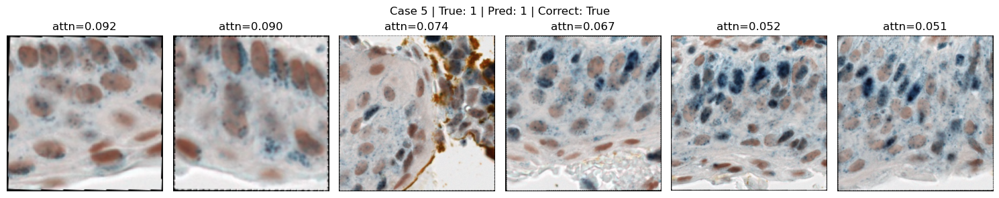


🧪 Case #16: True label = 0, Predicted = 0, Correct = True
Top patches with highest attention:
  - case_79_match_3_sox10_patch0.png: attention = 0.2591
  - case_79_match_3_sox10_patch4.png: attention = 0.2217
  - case_79_match_3_sox10_patch2.png: attention = 0.2051
  - case_79_match_3_sox10_patch3.png: attention = 0.1753
  - case_79_match_3_sox10_patch1.png: attention = 0.0133
  - case_79_match_3_sox10_patch95.png: attention = 0.0121


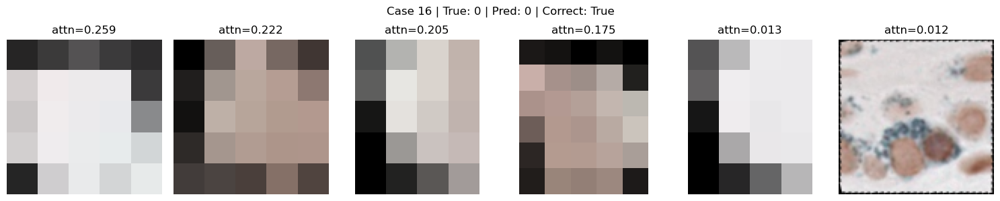

In [16]:
visualize_top_attended_patches(model, test_ds, num_cases=12, top_k=6)

In [19]:
def unnormalize(tensor, mean, std):
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    return tensor * std + mean

def visualize_top_attended_patches(model, test_ds, num_cases=3, top_k=5, bottom_k=5):
    model.eval()
    selected_indices = random.sample(range(len(test_ds)), num_cases)

    for idx in selected_indices:
        bag, label = test_ds[idx]
        bag = bag.unsqueeze(0).to(device)
        label = label.item()

        with torch.no_grad():
            logits, attn_weights = model(bag, return_attn_weights=True)
            pred = logits.argmax(dim=1).item()
            correct = (pred == label)
            attn_weights = attn_weights.squeeze(0).cpu().numpy()

        patch_paths = test_ds.bags[idx]
        bag_tensor = bag.squeeze(0).cpu()  # shape: (num_patches, 3, H, W)

        top_indices = attn_weights.argsort()[-top_k:][::-1]
        bottom_indices = attn_weights.argsort()[:bottom_k]

        def plot_patches(indices, title):
            plt.figure(figsize=(3 * len(indices), 3))
            for i, patch_idx in enumerate(indices):
                img_tensor = unnormalize(bag_tensor[patch_idx], [0.485, 0.456, 0.406], [0.229, 0.224, 0.225])
                patch_img = transforms.ToPILImage()(img_tensor.clamp(0, 1))  # clamp to avoid overflow

                weight = attn_weights[patch_idx]
                plt.subplot(1, len(indices), i + 1)
                plt.imshow(patch_img)
                plt.axis('off')
                plt.title(f"α={weight:.3f}", fontsize=9)
            plt.suptitle(title, fontsize=12)
            plt.tight_layout()
            plt.show()


        print(f"\n🧪 Case #{idx} | ID={test_ds.bags[idx][0].split('case_')[1][:3]} | True: {label} | Pred: {pred} | Correct: {correct}")

        print("🔝 Top attended patches:")
        plot_patches(top_indices, f"Top {top_k} patches (Highest Attention)")

        print("🔻 Least attended patches:")
        plot_patches(bottom_indices, f"Bottom {bottom_k} patches (Lowest Attention)")



🧪 Case #10 | ID=32_ | True: 1 | Pred: 1 | Correct: True
🔝 Top attended patches:


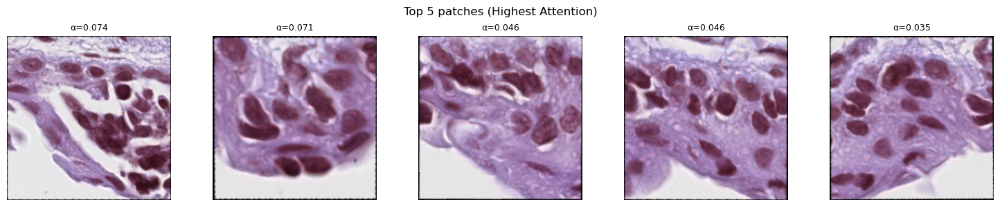

🔻 Least attended patches:


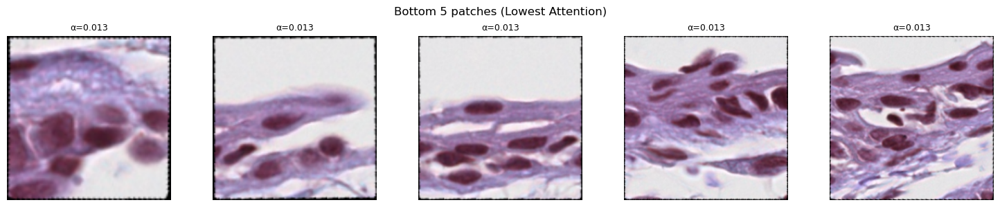


🧪 Case #12 | ID=97_ | True: 1 | Pred: 1 | Correct: True
🔝 Top attended patches:


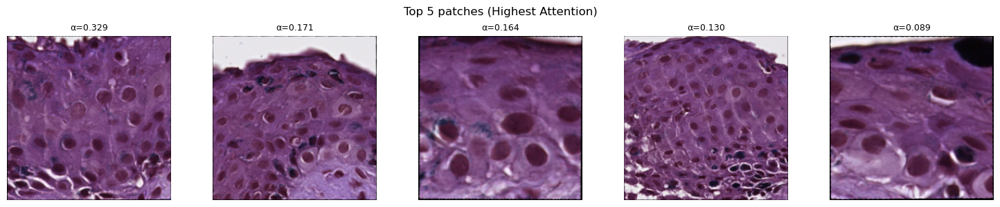

🔻 Least attended patches:


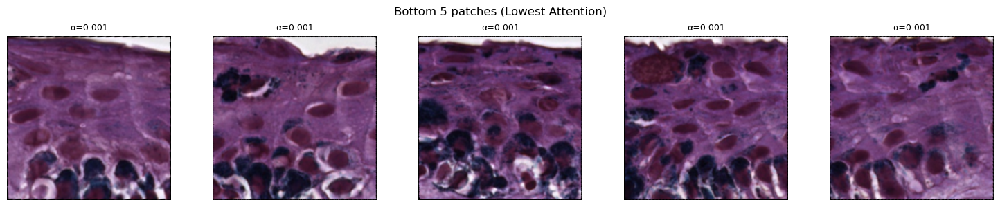


🧪 Case #5 | ID=34_ | True: 0 | Pred: 0 | Correct: True
🔝 Top attended patches:


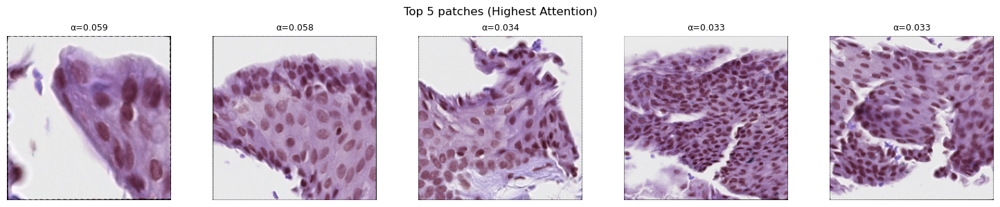

🔻 Least attended patches:


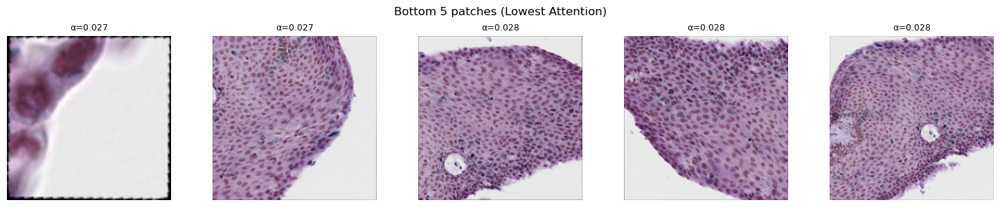


🧪 Case #0 | ID=30_ | True: 0 | Pred: 0 | Correct: True
🔝 Top attended patches:


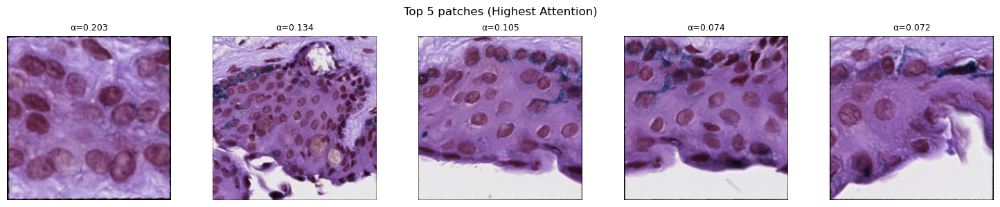

🔻 Least attended patches:


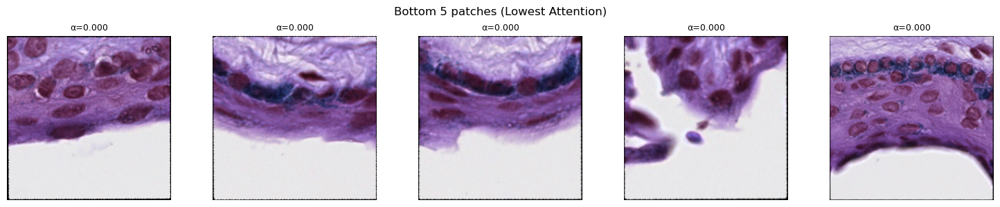


🧪 Case #16 | ID=1_u | True: 1 | Pred: 1 | Correct: True
🔝 Top attended patches:


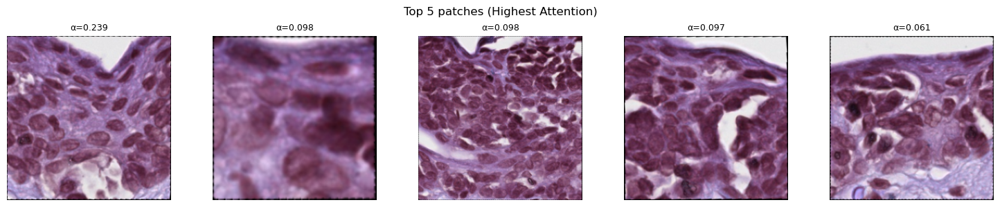

🔻 Least attended patches:


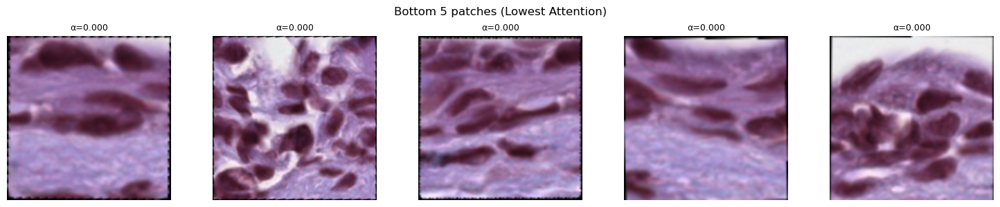

In [20]:
visualize_top_attended_patches(model, test_ds, num_cases=5, top_k=5, bottom_k=5)
